<a href="https://colab.research.google.com/github/Rithvikns/python/blob/main/Final_code.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


Data from previous Traning Model

In [ ]:
directory = "/content/drive/MyDrive/Colab Notebooks/data/"


In [ ]:
!pip install openpyxl
# Run this in Colab
!pip install torch torchvision torchaudio
!pip install torch-geometric
!pip install cdt
!pip install pgmpy


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 82.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 68.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 43.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 9.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 9.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 76.4 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvjitlink

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 48.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 756.0/756.0 kB 45.3 MB/s eta 0:00:00


Requirements File

In [ ]:
import glob
import os
import numpy as np
import pandas as pd
import time
import matplotlib.pyplot as plt
import networkx as nx
from sklearn.preprocessing import StandardScaler
import torch
import torch.nn.functional as F
from torch_geometric.nn import GCNConv
from torch_geometric.nn import GATConv
from torch_geometric.data import Data
from sklearn.metrics.pairwise import cosine_similarity
from torch_geometric.nn import MessagePassing
from torch_geometric.utils import add_self_loops
import torch.nn as nn
from pgmpy.estimators import PC
from cdt.utils.graph import remove_indirect_links
from itertools import combinations
from scipy.stats import pearsonr
import math


No GPU automatically detected. Setting SETTINGS.GPU to 0, and SETTINGS.NJOBS to cpu_count.


Visualize Graph

In [ ]:
def visualize_graph(G, time_value=None, title="Causal Graph"):
    """
    Visualize the causal graph with weights and optional time info on edges.

    Parameters:
    - G: NetworkX Graph or DiGraph
    - time_value: Optional, timestamp to annotate edges
    - title: Title of the plot
    """
    if G is None or G.number_of_nodes() == 0:
        print("Graph is empty. Nothing to visualize.")
        return

    plt.figure(figsize=(12, 8))

    pos = nx.spring_layout(G, seed=42)

    # Draw nodes
    nx.draw_networkx_nodes(G, pos, node_color='skyblue', node_size=2000)
    nx.draw_networkx_labels(G, pos, font_size=12)

    # Draw edges
    is_directed = G.is_directed()
    edge_func = nx.draw_networkx_edges if not is_directed else nx.draw_networkx_edges

    edge_func(G, pos, edge_color='gray', arrows=is_directed, arrowsize=20, width=2)

    # Build edge labels
    edge_labels = {}
    for u, v, d in G.edges(data=True):
        label = f"w={d.get('weight', 1.0)}"
        if time_value:
            label += f", t={time_value}"
        edge_labels[(u, v)] = label

    nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_color='black')

    plt.title(title, fontsize=14)
    plt.axis('off')
    plt.show()


EDGE Orientation

In [ ]:
def orient_edges_with_ipcd(sim_matrix, feature_names, data, threshold=0.3):
    """
    Uses a similarity matrix and pgmpy PC algorithm to infer directional edges.

    Parameters:
    - sim_matrix: 2D array-like, similarity between features.
    - feature_names: list of feature (column) names in the dataset.
    - data: pandas DataFrame containing the actual dataset.
    - threshold: float, similarity threshold to add additional edges.

    Returns:
    - directed_graph: A networkx.DiGraph with inferred directional edges.
    """

    if not isinstance(data, pd.DataFrame):
        raise ValueError("`data` must be a pandas DataFrame.")

    if not all(f in data.columns for f in feature_names):
        raise ValueError("All `feature_names` must be columns in the `data` DataFrame.")

    sim_matrix = np.array(sim_matrix)
    num_features = len(feature_names)

    # Run PC algorithm from pgmpy
    pc = PC(data[feature_names])
    skeleton = pc.build_skeleton(significance_level=0.05)
    pdag = pc.skeleton_to_pdag(skeleton[0], skeleton[1])
    dag = pc.pdag_to_dag(pdag)

    # Build final directed graph
    directed_graph = nx.DiGraph()
    directed_graph.add_nodes_from(feature_names)

    for u, v in dag.edges():
        directed_graph.add_edge(u, v)

    # Optionally use similarity to infer missing links
    for i in range(num_features):
        for j in range(num_features):
            if i != j and sim_matrix[i][j] > threshold:
                src, tgt = feature_names[i], feature_names[j]
                if not directed_graph.has_edge(src, tgt) and not directed_graph.has_edge(tgt, src):
                    directed_graph.add_edge(src, tgt)

    return directed_graph

Conditional Independence Model

In [ ]:
def is_conditionally_independent(X, Y, S, data, threshold=0.05):
    """
    Test conditional independence of X and Y given set S using partial correlation.
    """
    from sklearn.linear_model import LinearRegression
    import numpy as np

    if not S:
        corr, p_value = pearsonr(data[X], data[Y])
        return p_value > threshold

    # Regress X and Y on S
    model_X = LinearRegression().fit(data[S], data[X])
    model_Y = LinearRegression().fit(data[S], data[Y])

    res_X = data[X] - model_X.predict(data[S])
    res_Y = data[Y] - model_Y.predict(data[S])

    corr, p_value = pearsonr(res_X, res_Y)
    return p_value > threshold

Incremental Peter-Clark Algorithm

In [ ]:
def incremental_pc_algorithm(data, existing_graph=None, threshold=0.05):
    """
    Incrementally applies the PC algorithm on the dataset.
    Parameters:
        - data: Pandas DataFrame
        - existing_graph: Graph from previous step
        - threshold: p-value threshold for independence
    """
    import networkx as nx

    print("Running Incremental PC Algorithm...")

    # Step 1: Start with full graph if not passed
    if existing_graph is None:
        existing_graph = nx.complete_graph(data.columns.tolist())
        nx.set_edge_attributes(existing_graph, 1.0, "weight")

    # Step 2: Loop over pairs of nodes
    for (X, Y) in list(existing_graph.edges()):
        neighbors = list(existing_graph.neighbors(X))
        if Y in neighbors:
            neighbors.remove(Y)

        found_independent = False

        for k in range(0, len(neighbors) + 1):
            for cond_set in combinations(neighbors, k):
                if is_conditionally_independent(X, Y, list(cond_set), data, threshold):
                    existing_graph.remove_edge(X, Y)
                    found_independent = True
                    break
            if found_independent:
                break

    return existing_graph

Fuse Graph

In [ ]:
def fuse_graphs(*graphs):
    """
    Fuse multiple graphs by averaging weights or applying custom logic.
    Assumes all are NetworkX Graphs with same node set.
    """
    import networkx as nx
    fused = nx.Graph()

    all_nodes = set()
    for G in graphs:
        all_nodes.update(G.nodes())
    fused.add_nodes_from(all_nodes)

    edge_weights = {}

    for G in graphs:
        for u, v, d in G.edges(data=True):
            key = tuple(sorted([u, v]))
            weight = d.get("weight", 1.0)
            edge_weights[key] = edge_weights.get(key, 0) + weight

    # Normalize or average weights
    for (u, v), w in edge_weights.items():
        fused.add_edge(u, v, weight=round(w / len(graphs), 3))  # simple average

    return fused

Graph Convolution Network Model

In [ ]:
class GCN(torch.nn.Module):
    def __init__(self, num_features, hidden_dim=16):
        super(GCN, self).__init__()
        self.conv1 = GCNConv(num_features, hidden_dim)
        self.conv2 = GCNConv(hidden_dim, num_features)

    def forward(self, x, edge_index):
        x = self.conv1(x, edge_index)
        x = F.relu(x)
        x = self.conv2(x, edge_index)
        return x

def run_gcn(data_df):
    print("🏗 Running GCN for short-range causal inference...")

    # Normalize data
    data_tensor = torch.tensor(data_df.values, dtype=torch.float)
    num_nodes = data_df.shape[1]

    # Create a fully connected graph (you can change this)
    edge_index = []
    for i in range(num_nodes):
        for j in range(num_nodes):
            if i != j:
                edge_index.append([i, j])
    edge_index = torch.tensor(edge_index, dtype=torch.long).t().contiguous()

    # Create PyG Data object
    data = Data(x=data_tensor, edge_index=edge_index)

    # Define model
    model = GCN(num_features=num_nodes)
    optimizer = torch.optim.Adam(model.parameters(), lr=0.01)
    model.train()

    # Training loop
    for epoch in range(200):
        optimizer.zero_grad()
        out = model(data.x, data.edge_index)
        loss = F.mse_loss(out, data.x)
        loss.backward()
        optimizer.step()
        if epoch % 50 == 0:
            print(f"Epoch {epoch}, Loss: {loss.item():.4f}")

    # Output embedding similarities as causal weights
    model.eval()
    with torch.no_grad():
        embeddings = model(data.x, data.edge_index)
        embeddings = embeddings.T  # Shape: [num_nodes, embedding_dim]

    sim_matrix = cosine_similarity(embeddings.numpy())

    # Build causal graph
    causal_graph = nx.Graph()
    columns = data_df.columns.tolist()
    for col in columns:
        causal_graph.add_node(col)

    threshold = 0.3  # You can tune this
    for i in range(num_nodes):
        for j in range(i + 1, num_nodes):
            weight = sim_matrix[i][j]
            if weight > threshold:
                causal_graph.add_edge(columns[i], columns[j], weight=round(float(weight), 3))

    return causal_graph


GCN Testing

🏗 Running GCN for short-range causal inference...
Epoch 0, Loss: 0.4607
Epoch 50, Loss: 0.0110
Epoch 100, Loss: 0.0041
Epoch 150, Loss: 0.0027




The arrowsize keyword argument is not applicable when drawing edges
with LineCollection.

To make this warning go away, either specify `arrows=True` to
force FancyArrowPatches or use the default values.
Note that using FancyArrowPatches may be slow for large graphs.



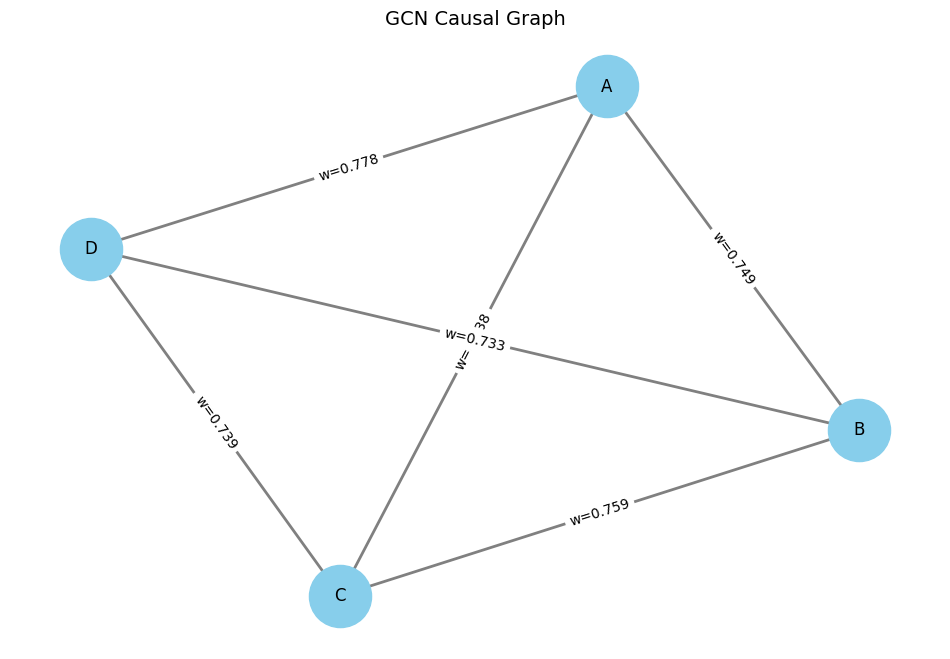

In [ ]:
df = pd.DataFrame({
    'A': np.random.rand(100),
    'B': np.random.rand(100),
    'C': np.random.rand(100),
    'D': np.random.rand(100)
})

causal_graph = run_gcn(df)
visualize_graph(causal_graph, title="GCN Causal Graph")


Message Parsing Neural Network

In [ ]:
# 🔧 Custom MPNN Layer
class MyMPNNLayer(MessagePassing):
    def __init__(self, in_channels, out_channels):
        super(MyMPNNLayer, self).__init__(aggr='mean')  # "mean" aggregation
        self.linear = torch.nn.Linear(in_channels, out_channels)

    def forward(self, x, edge_index):
        # Add self-loops to preserve own feature
        edge_index, _ = add_self_loops(edge_index, num_nodes=x.size(0))
        return self.propagate(edge_index, x=x)

    def message(self, x_j):
        # Message from neighbor j
        return self.linear(x_j)


# 🧠 MPNN Model Definition
class MPNN(torch.nn.Module):
    def __init__(self, in_channels, hidden_channels):
        super(MPNN, self).__init__()
        self.mp1 = MyMPNNLayer(in_channels, hidden_channels)
        self.mp2 = MyMPNNLayer(hidden_channels, in_channels)

    def forward(self, x, edge_index):
        x = self.mp1(x, edge_index)
        x = F.relu(x)
        x = self.mp2(x, edge_index)
        return x


# 🚀 Main Function
def run_mpnn(data_df):
    print("📡 Running MPNN for long-range causal inference...")

    data_tensor = torch.tensor(data_df.values, dtype=torch.float)
    num_nodes = data_df.shape[1]

    # Fully connected edge_index (excluding self-loops initially)
    edge_index = []
    for i in range(num_nodes):
        for j in range(num_nodes):
            if i != j:
                edge_index.append([i, j])
    edge_index = torch.tensor(edge_index, dtype=torch.long).t().contiguous()

    # Create PyTorch Geometric Data
    data = Data(x=data_tensor, edge_index=edge_index)

    # Model & training
    model = MPNN(in_channels=num_nodes, hidden_channels=16)
    optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

    model.train()
    for epoch in range(200):
        optimizer.zero_grad()
        out = model(data.x, data.edge_index)
        loss = F.mse_loss(out, data.x)
        loss.backward()
        optimizer.step()
        if epoch % 50 == 0:
            print(f"Epoch {epoch}, Loss: {loss.item():.4f}")

    # Node embeddings
    model.eval()
    with torch.no_grad():
        embeddings = model(data.x, data.edge_index)
        embeddings = embeddings.T  # shape: [num_nodes, embedding_dim]

    # Cosine similarity between nodes
    sim_matrix = cosine_similarity(embeddings.numpy())

    # Build causal graph from sim matrix
    causal_graph = nx.Graph()
    columns = data_df.columns.tolist()
    for col in columns:
        causal_graph.add_node(col)

    threshold = 0.3
    for i in range(num_nodes):
        for j in range(i + 1, num_nodes):
            weight = sim_matrix[i][j]
            if weight > threshold:
                causal_graph.add_edge(columns[i], columns[j], weight=round(float(weight), 3))

    return causal_graph


📡 Running MPNN for long-range causal inference...
Epoch 0, Loss: 0.3687
Epoch 50, Loss: 0.0252
Epoch 100, Loss: 0.0032
Epoch 150, Loss: 0.0023




The arrowsize keyword argument is not applicable when drawing edges
with LineCollection.

To make this warning go away, either specify `arrows=True` to
force FancyArrowPatches or use the default values.
Note that using FancyArrowPatches may be slow for large graphs.



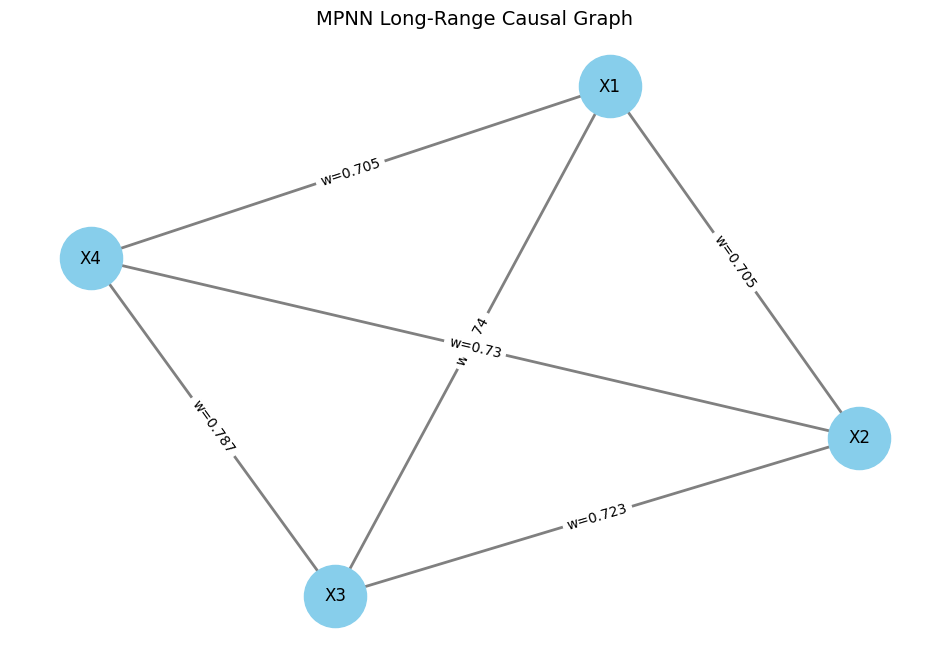

In [ ]:
df = pd.DataFrame({
    'X1': np.random.rand(100),
    'X2': np.random.rand(100),
    'X3': np.random.rand(100),
    'X4': np.random.rand(100)
})

long_range_graph = run_mpnn(df)
visualize_graph(long_range_graph, title="MPNN Long-Range Causal Graph")


Multi Layer Neural Network Model

In [ ]:
class MLNN(nn.Module):
    def __init__(self, input_dim, hidden_dims=[64, 32]):
        super(MLNN, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, hidden_dims[0]),
            nn.ReLU(),
            nn.Linear(hidden_dims[0], hidden_dims[1]),
            nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(hidden_dims[1], hidden_dims[0]),
            nn.ReLU(),
            nn.Linear(hidden_dims[0], input_dim)
        )

    def forward(self, x):
        z = self.encoder(x)
        out = self.decoder(z)
        return out, z  # z is the encoded latent (hierarchical) representation


# 🚀 MLNN Function
def run_mlnn(data_df):
    print("🏛 Running MLNN for hierarchical causal inference...")

    data_tensor = torch.tensor(data_df.values, dtype=torch.float)
    num_samples, num_features = data_tensor.shape

    # Model + optimizer
    model = MLNN(input_dim=num_features)
    optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

    # Training
    model.train()
    for epoch in range(200):
        optimizer.zero_grad()
        output, _ = model(data_tensor)
        loss = F.mse_loss(output, data_tensor)
        loss.backward()
        optimizer.step()
        if epoch % 50 == 0:
            print(f"Epoch {epoch}, Loss: {loss.item():.4f}")

    # Extract hierarchical embeddings (latent features)
    model.eval()
    with torch.no_grad():
        _, embeddings = model(data_tensor)  # Shape: [samples, latent_dim]
        embeddings = embeddings.T  # Shape: [latent_dim, samples]

    # Compute similarity between features (variables)
    feature_embeddings = embeddings.numpy()
    sim_matrix = cosine_similarity(feature_embeddings)

    # Build causal graph
    causal_graph = nx.Graph()
    columns = data_df.columns.tolist()
    for col in columns:
        causal_graph.add_node(col)

    threshold = 0.3
    for i in range(num_features):
        for j in range(i + 1, num_features):
            weight = sim_matrix[i][j]
            if weight > threshold:
                causal_graph.add_edge(columns[i], columns[j], weight=round(float(weight), 3))

    return causal_graph


In [ ]:
class GAT(torch.nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels, heads=1):
        super(GAT, self).__init__()
        self.gat1 = GATConv(in_channels, hidden_channels, heads=heads)
        self.gat2 = GATConv(hidden_channels * heads, out_channels, heads=1)

    def forward(self, x, edge_index):
        x = self.gat1(x, edge_index)
        x = F.elu(x)
        x = self.gat2(x, edge_index)
        return x

# 🚀 Main Function
def run_gat(data_df):
    print("🔍 Running GAT for causal inference...")

    data_tensor = torch.tensor(data_df.values, dtype=torch.float)
    num_nodes = data_df.shape[1]

    # Fully connected graph
    edge_index = []
    for i in range(num_nodes):
        for j in range(num_nodes):
            if i != j:
                edge_index.append([i, j])
    edge_index = torch.tensor(edge_index, dtype=torch.long).t().contiguous()

    # Create PyTorch Geometric Data
    data = Data(x=data_tensor, edge_index=edge_index)

    # Model & optimizer
    model = GAT(in_channels=num_nodes, hidden_channels=16, out_channels=num_nodes)
    optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

    # Train
    model.train()
    for epoch in range(200):
        optimizer.zero_grad()
        out = model(data.x, data.edge_index)
        loss = F.mse_loss(out, data.x)
        loss.backward()
        optimizer.step()
        if epoch % 50 == 0:
            print(f"Epoch {epoch}, Loss: {loss.item():.4f}")

    # Node embeddings
    model.eval()
    with torch.no_grad():
        embeddings = model(data.x, data.edge_index)
        embeddings = embeddings.T  # [num_nodes, embedding_dim]

    # Cosine similarity
    sim_matrix = cosine_similarity(embeddings.numpy())

    # Build causal graph
    causal_graph = nx.Graph()
    columns = data_df.columns.tolist()
    for col in columns:
        causal_graph.add_node(col)

    threshold = 0.3
    for i in range(num_nodes):
        for j in range(i + 1, num_nodes):
            weight = sim_matrix[i][j]
            if weight > threshold:
                causal_graph.add_edge(columns[i], columns[j], weight=round(float(weight), 3))

    return causal_graph

In [ ]:
# 🧪 Testing GAT on Synthetic Data
def test_gat():
    np.random.seed(42)
    dummy_data = pd.DataFrame(
        np.random.rand(100, 5),  # 100 samples, 5 variables
        columns=['A', 'B', 'C', 'D', 'E']
    )
    graph = run_gat(dummy_data)

    print("🧩 Edges in the causal graph:")
    for u, v, d in graph.edges(data=True):
        print(f"{u} -> {v}, weight: {d['weight']}")

test_gat()


🔍 Running GAT for causal inference...
Epoch 0, Loss: 0.5215
Epoch 50, Loss: 0.0098
Epoch 100, Loss: 0.0036
Epoch 150, Loss: 0.0033
🧩 Edges in the causal graph:
A -> B, weight: 0.725
A -> C, weight: 0.691
A -> D, weight: 0.775
A -> E, weight: 0.703
B -> C, weight: 0.785
B -> D, weight: 0.762
B -> E, weight: 0.706
C -> D, weight: 0.717
C -> E, weight: 0.703
D -> E, weight: 0.789


Graph based Generative Adversial Network

In [ ]:
# 🎲 Generator
class Generator(nn.Module):
    def __init__(self, noise_dim, out_dim):
        super(Generator, self).__init__()
        self.fc = nn.Sequential(
            nn.Linear(noise_dim, 64),
            nn.ReLU(),
            nn.Linear(64, out_dim)
        )

    def forward(self, z):
        return self.fc(z)

# ❌ Discriminator
class Discriminator(nn.Module):
    def __init__(self, in_dim):
        super(Discriminator, self).__init__()
        self.fc = nn.Sequential(
            nn.Linear(in_dim, 64),
            nn.ReLU(),
            nn.Linear(64, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.fc(x)

# 🚀 Run GAN for Causal Similarity
def run_gan(data_df, noise_dim=16):
    print("🎮 Running GAN for causal similarity inference...")

    data = torch.tensor(data_df.values, dtype=torch.float)
    num_samples, num_features = data.shape

    generator = Generator(noise_dim, num_features)
    discriminator = Discriminator(num_features)

    g_optimizer = torch.optim.Adam(generator.parameters(), lr=0.001)
    d_optimizer = torch.optim.Adam(discriminator.parameters(), lr=0.001)

    criterion = nn.BCELoss()

    for epoch in range(200):
        # Train Discriminator
        real_data = data
        noise = torch.randn(num_samples, noise_dim)
        fake_data = generator(noise).detach()

        d_real = discriminator(real_data)
        d_fake = discriminator(fake_data)

        loss_d = criterion(d_real, torch.ones_like(d_real)) + \
                 criterion(d_fake, torch.zeros_like(d_fake))

        d_optimizer.zero_grad()
        loss_d.backward()
        d_optimizer.step()

        # Train Generator
        noise = torch.randn(num_samples, noise_dim)
        generated = generator(noise)
        d_generated = discriminator(generated)

        loss_g = criterion(d_generated, torch.ones_like(d_generated))

        g_optimizer.zero_grad()
        loss_g.backward()
        g_optimizer.step()

        if epoch % 50 == 0:
            print(f"Epoch {epoch}, Loss D: {loss_d.item():.4f}, Loss G: {loss_g.item():.4f}")

    # 🔍 Cosine similarity between features in generated output
    with torch.no_grad():
        gen_output = generator(torch.randn(num_samples, noise_dim))
        embeddings = gen_output.T  # [num_features, num_samples]

    sim_matrix = cosine_similarity(embeddings.numpy())

    # Build graph
    causal_graph = nx.Graph()
    columns = data_df.columns.tolist()
    for col in columns:
        causal_graph.add_node(col)

    threshold = 0.3
    for i in range(num_features):
        for j in range(i + 1, num_features):
            sim = sim_matrix[i][j]
            if sim > threshold:
                causal_graph.add_edge(columns[i], columns[j], weight=round(float(sim), 3))

    return causal_graph

In [ ]:
def test_gan():
    np.random.seed(42)
    dummy_df = pd.DataFrame(
        np.random.rand(200, 5),
        columns=['X1', 'X2', 'X3', 'X4', 'X5']
    )
    graph = run_gan(dummy_df)
    print("🔗 Causal (similarity-based) edges:")
    for u, v, d in graph.edges(data=True):
        print(f"{u} - {v}, weight: {d['weight']}")

test_gan()


🎮 Running GAN for causal similarity inference...
Epoch 0, Loss D: 1.4192, Loss G: 0.8477
Epoch 50, Loss D: 1.4025, Loss G: 0.6722
Epoch 100, Loss D: 1.3895, Loss G: 0.9436
Epoch 150, Loss D: 1.2788, Loss G: 0.7132
🔗 Causal (similarity-based) edges:
X1 - X3, weight: 0.99
X1 - X4, weight: 0.967
X1 - X5, weight: 0.962
X3 - X4, weight: 0.957
X3 - X5, weight: 0.965
X4 - X5, weight: 0.942


In [ ]:
def z_score_normalization(df):
    result = ((df - df.mean()).round())
    result = result.replace(-0, 0)
    return result

In [ ]:
def get_excel_files(directory):
    file_list = glob.glob(os.path.join(directory, "*_samples.xlsx"))
    file_list = [f for f in file_list if os.path.basename(f).split('_')[0].isdigit()]
    return sorted(file_list, key=lambda x: int(os.path.basename(x).split('_')[0]), reverse=True)

def load_sheets(file_list, num_sheets=6):
    dataframes = {}
    for file in file_list:
        sheets = pd.read_excel(file, sheet_name=None)
        sheet_names = list(sheets.keys())[:num_sheets]
        dataframes[file] = {name: sheets[name] for name in sheet_names}
    return dataframes


def process_data(dataframes):
    timestamp = 0
    data_history = []
    incremental_model = None  # Initialize IncrementalPC instance as None

    for file, sheets in dataframes.items():
        min_cols = min(len(df.columns) for df in sheets.values())

        for col_idx in range(min_cols):
            timestamp += 2
            row_data = {"Time": timestamp}

            for sheet_name, df in sheets.items():
                column_name = df.columns[col_idx]
                column_data = df[column_name]

                for i in range(6):
                    row_data[f"car_{i+1}_{sheet_name}"] = column_data[i]
                for i in range(3):
                    row_data[f"charger_{i+1}_{sheet_name}"] = column_data[i+6]

            data_history.append(row_data)
            print(timestamp)

            if len(data_history) == 20:
                df_result = pd.DataFrame(data_history)
                print(df_result)
                process_columns_in_steps(df_result)

            if len(data_history) >= 40:
                print("\nReached processing limit (40 rows). Exiting loop gracefully.\n")
                return  # ✅ Exits the function cleanly instead of just breaking the inner loop

            time.sleep(0.05)


def process_columns_in_steps(df, initial_columns=5, step=1):
    total_columns = df.shape[1]
    first_columns = list(df.columns[:initial_columns])  # Always include first N columns

    # Start from the initial size and keep adding step size
    for end in range(initial_columns, total_columns + step, step):
        # Add the next chunk of columns
        additional_columns = df.columns[initial_columns:end]
        selected_columns = list(first_columns) + list(additional_columns)

        # Create filtered DataFrame
        filtered_df = df[selected_columns]

        # Call the next function
        next_function(filtered_df)

def next_function(data):
    print(f"\n🔍 Processing columns: {list(data.columns)}")

    time_value = data["Time"].iloc[0] if "Time" in data.columns else None
    data_no_time = data.drop(columns=["Time"]) if "Time" in data.columns else data

    print(z_score_normalization(data_no_time))
    # Step 1: GNNs & ML models for different causal features
    local_causality = run_gcn(data_no_time)       # Short-range
    long_range = run_mpnn(data_no_time)           # Long-range
    hierarchical = run_mlnn(data_no_time)         # Hierarchical influence
    attention_scores = run_gat(data_no_time)      # Node importance
    adaptive_structure = run_gan(data_no_time)  # Adaptive / generative modeling

    # Step 2: Fuse causal info into a weighted undirected graph
    fused_graph = fuse_graphs(
        local_causality, long_range,
        hierarchical, attention_scores,
        adaptive_structure
    )

    # Step 3: Causal Discovery (Final layer)
    causal_graph = incremental_pc_algorithm(data_no_time, fused_graph)

    # Step 4: Edge Orientation
    causal_graph = incremental_pc_algorithm(data_no_time, fused_graph)

    # Step 5: Visualize
    visualize_graph(causal_graph, time_value)





def main():
    directory = "/content/drive/MyDrive/Colab Notebooks/data/"
    file_list = get_excel_files(directory)
    dataframes = load_sheets(file_list)
    process_data(dataframes)

if __name__ == "__main__":
    main()

KeyboardInterrupt: 

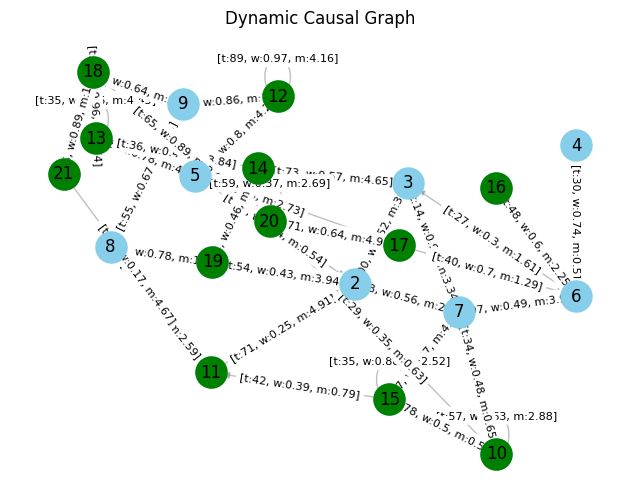

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import random
from IPython.display import HTML

# --- Step 1: Create a connected random directed graph ---
num_nodes = 10
while True:
    G = nx.erdos_renyi_graph(n=num_nodes, p=0.2, directed=True)
    if nx.is_strongly_connected(G):
        break

# Assign random weights and timestamps to edges
for u, v in G.edges():
    G[u][v]['weight'] = round(random.uniform(0.1, 1.0), 2)
    G[u][v]['timestamp'] = random.randint(1, 100)
    G[u][v]['metrics'] = round(random.uniform(0.1, 5.0), 2)

# Define node positions for consistent layout
pos = nx.spring_layout(G, seed=42)

# --- Step 2: Set up the figure ---
fig, ax = plt.subplots(figsize=(8, 6))
ax.set_title("Dynamic Graph")

# Keep track of newly added nodes
new_nodes = []
deleted_nodes = set()

def update(frame):
    global num_nodes
    ax.clear()
    ax.set_title("Dynamic Causal Graph")

    # Add a new node every few frames
    if frame < 10:
        new_node = num_nodes
        G.add_node(new_node)
        new_nodes.append(new_node)
        num_nodes += 1

        # Connect it to a few existing nodes
        existing_nodes = list(G.nodes())
        random.shuffle(existing_nodes)
        for target in existing_nodes[:random.randint(2, 4)]:
            G.add_edge(new_node, target, weight=round(random.uniform(0.1, 1.0), 2),
                       timestamp=random.randint(1, 100),
                       metrics=round(random.uniform(0.1, 5.0), 2))

        # Update positions
        pos.update(nx.spring_layout(G, pos=pos, fixed=pos.keys(), seed=42))

    # After 10 nodes are added, delete 2 original nodes
    if frame == 12 and len(G.nodes()) > 10:
        removable_nodes = list(set(G.nodes()) - set(new_nodes))
        if len(removable_nodes) >= 2:
            to_remove = random.sample(removable_nodes, 2)
            for node in to_remove:
                G.remove_node(node)
                deleted_nodes.add(node)

    # Draw the graph
    nx.draw_networkx_edges(G, pos, ax=ax, edge_color='gray', alpha=0.5, arrows=True)
    nx.draw_networkx_nodes(G, pos, ax=ax, node_color='skyblue', node_size=500)
    nx.draw_networkx_labels(G, pos, ax=ax)

    # Draw edge labels with timestamp, weight, and metrics
    edge_labels = {(u, v): f"[t:{G[u][v]['timestamp']}, w:{G[u][v]['weight']}, m:{G[u][v]['metrics']}]"
                   for u, v in G.edges()}
    nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, ax=ax, font_size=8)

    # Highlight new nodes
    nx.draw_networkx_nodes(G, pos, nodelist=new_nodes, ax=ax, node_color='green', node_size=500)

    # Remove axes for cleaner look
    ax.set_axis_off()

# Create animation
ani = animation.FuncAnimation(fig, update, frames=15, interval=1000, repeat=False)

# Display the animation in the notebook
HTML(ani.to_jshtml())


In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import random
from IPython.display import HTML

# --- Step 1: Create one single global graph ---
def create_initial_graph():
    num_nodes = 25
    while True:
        G = nx.erdos_renyi_graph(n=num_nodes, p=0.2)
        if nx.is_connected(G):
            break

    # Assign edge attributes
    for u, v in G.edges():
        G[u][v]['weight'] = round(random.uniform(0.1, 1.0), 2)
        G[u][v]['timestamp'] = random.randint(1, 100)
        G[u][v]['metrics'] = round(random.uniform(0.1, 5.0), 2)

    pos = nx.spring_layout(G, seed=42)  # Fixed layout for consistency
    return G, pos

# Create graph globally
global_graph, global_pos = create_initial_graph()

# --- Step 2: Dynamic evolving graph animation ---
def dynamic_evolving_graph(G, pos):
    fig, ax = plt.subplots(figsize=(8, 6))
    ax.set_title("Dynamic Causal Graph")

    new_nodes = []
    deleted_nodes = set()
    current_num_nodes = [len(G.nodes())]

    def update(frame):
        ax.clear()
        ax.set_title("Dynamic Causal Graph")

        # Add new node logic
        if frame < 10:
            new_node = max(G.nodes()) + 1
            G.add_node(new_node)
            new_nodes.append(new_node)
            current_num_nodes[0] += 1

            existing_nodes = list(G.nodes())
            existing_nodes.remove(new_node)
            random.shuffle(existing_nodes)

            for target in existing_nodes[:random.randint(2, 4)]:
                G.add_edge(new_node, target,
                           weight=round(random.uniform(0.1, 1.0), 2),
                           timestamp=random.randint(1, 100),
                           metrics=round(random.uniform(0.1, 5.0), 2))

            # Update layout
            pos.update(nx.spring_layout(G, pos=pos, fixed=pos.keys(), seed=42))

        # Delete nodes logic
        if frame == 12 and len(G.nodes()) > 10:
            removable_nodes = list(set(G.nodes()) - set(new_nodes))
            if len(removable_nodes) >= 2:
                to_remove = random.sample(removable_nodes, 2)
                for node in to_remove:
                    G.remove_node(node)
                    deleted_nodes.add(node)

        # Draw the graph
        nx.draw_networkx_edges(G, pos, ax=ax, edge_color='gray', alpha=0.5)
        nx.draw_networkx_nodes(G, pos, ax=ax, node_color='skyblue', node_size=500)
        nx.draw_networkx_labels(G, pos, ax=ax)

        edge_labels = {(u, v): f"[t:{G[u][v]['timestamp']}, w:{G[u][v]['weight']}, m:{G[u][v]['metrics']}]"
                       for u, v in G.edges()}
        nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, ax=ax, font_size=8)

        # Highlight new nodes
        nx.draw_networkx_nodes(G, pos, nodelist=new_nodes, ax=ax, node_color='green', node_size=500)

        ax.set_axis_off()

    ani = animation.FuncAnimation(fig, update, frames=15, interval=1000, repeat=False)
    plt.close(fig)
    return ani

# --- Step 3: Anomaly flow animation on the same graph ---
def anomaly_flow_graph(G, pos):
    nodes = list(G.nodes())
    if len(nodes) < 2:
        print("Not enough nodes for path animation.")
        return None

    # Select start and failure nodes from existing graph
    start_node = random.choice(nodes)
    failure_node = random.choice(nodes)
    while failure_node == start_node:
        failure_node = random.choice(nodes)

    try:
        path = nx.shortest_path(G, source=start_node, target=failure_node)
    except nx.NetworkXNoPath:
        print(f"No path between {start_node} and {failure_node}.")
        return None

    print(f"Anomaly Path from {start_node} to {failure_node}: {path}")

    fig, ax = plt.subplots(figsize=(8, 6))
    ax.set_title("Anomaly Flow Through Graph")

    def update(frame):
        ax.clear()
        ax.set_title("Anomaly Flow Through Graph")

        # Draw base graph
        nx.draw_networkx_edges(G, pos, ax=ax, edge_color='gray', alpha=0.5)
        nx.draw_networkx_nodes(G, pos, ax=ax, node_color='skyblue', node_size=500)
        nx.draw_networkx_labels(G, pos, ax=ax)

        # Draw edge labels: include weight, timestamp, metrics
        edge_labels = {(u, v): f"[t:{G[u][v]['timestamp']}, w:{G[u][v]['weight']}, m:{G[u][v]['metrics']}]"
                       for u, v in G.edges()}
        nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, ax=ax, font_size=8)

        # Highlight start and failure nodes
        nx.draw_networkx_nodes(G, pos, nodelist=[start_node], ax=ax, node_color='green', node_size=600)
        nx.draw_networkx_nodes(G, pos, nodelist=[failure_node], ax=ax, node_color='orange', node_size=600)

        # Highlight path progress
        if frame > 0:
            path_nodes = path[:frame+1]
            nx.draw_networkx_nodes(G, pos, nodelist=path_nodes, ax=ax, node_color='red', node_size=500)

            if len(path_nodes) > 1:
                path_edges = [(path_nodes[i], path_nodes[i+1]) for i in range(len(path_nodes)-1)]
                nx.draw_networkx_edges(G, pos, edgelist=path_edges, ax=ax, edge_color='red', width=2)

        ax.set_axis_off()

    ani = animation.FuncAnimation(fig, update, frames=len(path), interval=1000, repeat=False)
    plt.close(fig)
    return ani

# --- Step 4: Run both animations using the same graph ---

ani1 = dynamic_evolving_graph(global_graph, global_pos)
display(HTML(ani1.to_jshtml()))

# Wait for the first animation to finish
import time
time.sleep(16)  # Adjust depending on your number of frames

ani2 = anomaly_flow_graph(global_graph, global_pos)
if ani2:
    display(HTML(ani2.to_jshtml()))


Anomaly Path from 34 to 18: [34, 33, 25, 18]


Anomaly Path from 15 to 16: [15, 1, 13, 16]


Reduced Graph Nodes: [0, 1, 2, 3, 4, 5, 6, 8, 9, 10, 11, 12, 13, 14, 16, 17, 18, 19, 21, 22, 23, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46]
Anomaly Path from 16 to 0: [16, 8, 2, 0]


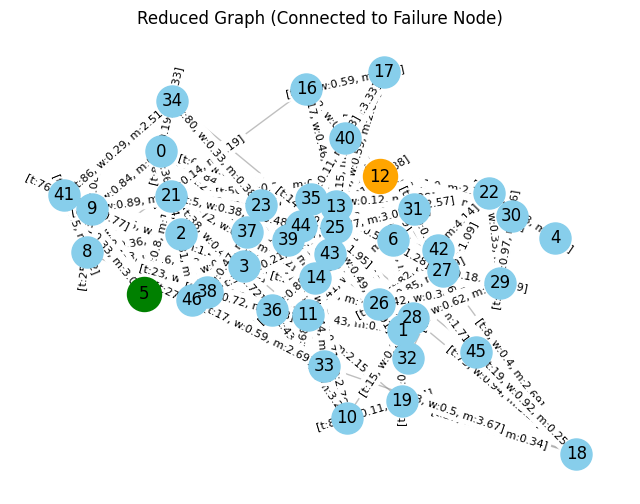

    Node                                              Paths  \
0      0                          [[0, 2, 12], [0, 23, 12]]   
1      1                                      [[1, 13, 12]]   
2      2    [[2, 3, 12], [2, 12], [2, 21, 12], [2, 23, 12]]   
3      3  [[3, 2, 12], [3, 12], [3, 13, 12], [3, 23, 12]...   
4      4                             [[4, 12], [4, 22, 12]]   
5      5                                      [[5, 21, 12]]   
6      6                         [[6, 13, 12], [6, 21, 12]]   
7      8              [[8, 2, 12], [8, 3, 12], [8, 16, 12]]   
8      9              [[9, 2, 12], [9, 3, 12], [9, 21, 12]]   
9     10                                                  -   
10    11                       [[11, 13, 12], [11, 23, 12]]   
11    12                                             [[12]]   
12    13              [[13, 3, 12], [13, 12], [13, 16, 12]]   
13    14  [[14, 2, 12], [14, 3, 12], [14, 13, 12], [14, ...   
14    16                           [[16, 12], [16, 13, 

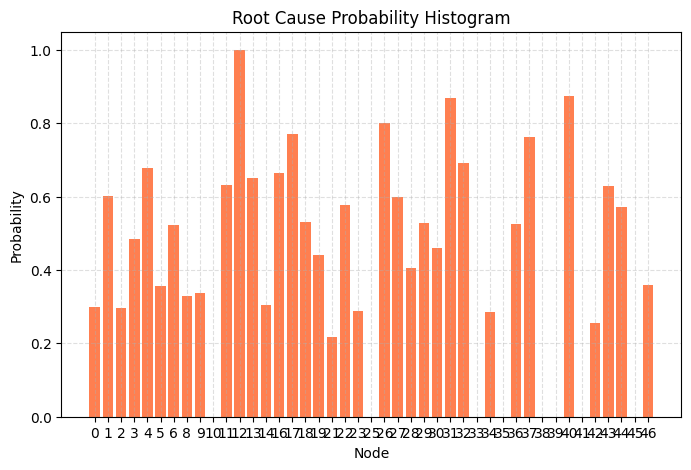

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import random
from IPython.display import HTML

# --- Step 1: Create one single global graph ---
def create_initial_graph():
    num_nodes = 25
    while True:
        G = nx.erdos_renyi_graph(n=num_nodes, p=0.2)
        if nx.is_connected(G):
            break

    # Assign edge attributes
    for u, v in G.edges():
        G[u][v]['weight'] = round(random.uniform(0.1, 1.0), 2)
        G[u][v]['timestamp'] = random.randint(1, 100)
        G[u][v]['metrics'] = round(random.uniform(0.1, 5.0), 2)

    pos = nx.spring_layout(G, seed=42)  # Fixed layout for consistency
    return G, pos

# Create graph globally
global_graph, global_pos = create_initial_graph()

# --- Step 2: Dynamic evolving graph animation ---
def dynamic_evolving_graph(G, pos):
    fig, ax = plt.subplots(figsize=(8, 6))
    ax.set_title("Dynamic Causal Graph")

    new_nodes = []
    deleted_nodes = set()
    current_num_nodes = [len(G.nodes())]

    def update(frame):
        ax.clear()
        ax.set_title("Dynamic Causal Graph")

        # Add new node logic
        if frame < 10:
            new_node = max(G.nodes()) + 1
            G.add_node(new_node)
            new_nodes.append(new_node)
            current_num_nodes[0] += 1

            existing_nodes = list(G.nodes())
            existing_nodes.remove(new_node)
            random.shuffle(existing_nodes)

            for target in existing_nodes[:random.randint(2, 4)]:
                G.add_edge(new_node, target,
                           weight=round(random.uniform(0.1, 1.0), 2),
                           timestamp=random.randint(1, 100),
                           metrics=round(random.uniform(0.1, 5.0), 2))

            # Update layout
            pos.update(nx.spring_layout(G, pos=pos, fixed=pos.keys(), seed=42))

        # Delete nodes logic
        if frame == 12 and len(G.nodes()) > 10:
            removable_nodes = list(set(G.nodes()) - set(new_nodes))
            if len(removable_nodes) >= 2:
                to_remove = random.sample(removable_nodes, 2)
                for node in to_remove:
                    G.remove_node(node)
                    deleted_nodes.add(node)

        # Draw the graph
        nx.draw_networkx_edges(G, pos, ax=ax, edge_color='gray', alpha=0.5)
        nx.draw_networkx_nodes(G, pos, ax=ax, node_color='skyblue', node_size=500)
        nx.draw_networkx_labels(G, pos, ax=ax)

        edge_labels = {(u, v): f"[t:{G[u][v]['timestamp']}, w:{G[u][v]['weight']}, m:{G[u][v]['metrics']}]"
                       for u, v in G.edges()}
        nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, ax=ax, font_size=8)

        # Highlight new nodes
        nx.draw_networkx_nodes(G, pos, nodelist=new_nodes, ax=ax, node_color='green', node_size=500)

        ax.set_axis_off()

    ani = animation.FuncAnimation(fig, update, frames=15, interval=1000, repeat=False)
    plt.close(fig)
    return ani

# --- Step 3: Anomaly flow animation on the same graph ---
def anomaly_flow_graph(G, pos):
    nodes = list(G.nodes())
    if len(nodes) < 2:
        print("Not enough nodes for path animation.")
        return None

    # Select start and failure nodes from existing graph
    start_node = random.choice(nodes)
    failure_node = random.choice(nodes)
    while failure_node == start_node:
        failure_node = random.choice(nodes)

    try:
        path = nx.shortest_path(G, source=start_node, target=failure_node)
    except nx.NetworkXNoPath:
        print(f"No path between {start_node} and {failure_node}.")
        return None

    print(f"Anomaly Path from {start_node} to {failure_node}: {path}")

    fig, ax = plt.subplots(figsize=(8, 6))
    ax.set_title("Anomaly Flow Through Graph")

    def update(frame):
        ax.clear()
        ax.set_title("Anomaly Flow Through Graph")

        # Draw base graph
        nx.draw_networkx_edges(G, pos, ax=ax, edge_color='gray', alpha=0.5)
        nx.draw_networkx_nodes(G, pos, ax=ax, node_color='skyblue', node_size=500)
        nx.draw_networkx_labels(G, pos, ax=ax)

        # Draw edge labels: include weight, timestamp, metrics
        edge_labels = {(u, v): f"[t:{G[u][v]['timestamp']}, w:{G[u][v]['weight']}, m:{G[u][v]['metrics']}]"
                       for u, v in G.edges()}
        nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, ax=ax, font_size=8)

        # Highlight start and failure nodes
        nx.draw_networkx_nodes(G, pos, nodelist=[start_node], ax=ax, node_color='green', node_size=600)
        nx.draw_networkx_nodes(G, pos, nodelist=[failure_node], ax=ax, node_color='orange', node_size=600)

        # Highlight path progress
        if frame > 0:
            path_nodes = path[:frame+1]
            nx.draw_networkx_nodes(G, pos, nodelist=path_nodes, ax=ax, node_color='red', node_size=500)

            if len(path_nodes) > 1:
                path_edges = [(path_nodes[i], path_nodes[i+1]) for i in range(len(path_nodes)-1)]
                nx.draw_networkx_edges(G, pos, edgelist=path_edges, ax=ax, edge_color='red', width=2)

        ax.set_axis_off()

    ani = animation.FuncAnimation(fig, update, frames=len(path), interval=1000, repeat=False)
    plt.close(fig)
    return ani

# --- Step 4: Run both animations using the same graph ---

ani1 = dynamic_evolving_graph(global_graph, global_pos)
display(HTML(ani1.to_jshtml()))

# Wait for the first animation to finish
import time
time.sleep(16)  # Adjust depending on your number of frames

ani2 = anomaly_flow_graph(global_graph, global_pos)
if ani2:
    display(HTML(ani2.to_jshtml()))

# --- Step 3: Anomaly flow animation on the same graph with reduced nodes ---
def anomaly_flow_graph_with_reduced_nodes(G, pos):
    nodes = list(G.nodes())
    if len(nodes) < 2:
        print("Not enough nodes for path animation.")
        return None

    # Select start and failure nodes from existing graph
    start_node = random.choice(nodes)
    failure_node = random.choice(nodes)
    while failure_node == start_node:
        failure_node = random.choice(nodes)

    try:
        # Path from start node to failure node
        path = nx.shortest_path(G, source=start_node, target=failure_node)
    except nx.NetworkXNoPath:
        print(f"No path between {start_node} and {failure_node}.")
        return None

    # Step 1: Get all nodes connected to the failure node (directly or indirectly)
    connected_nodes = set(nx.node_connected_component(G, failure_node))

    # Step 2: Remove nodes not connected to failure node
    nodes_to_remove = set(G.nodes()) - connected_nodes
    G.remove_nodes_from(nodes_to_remove)

    print(f"Reduced Graph Nodes: {G.nodes()}")
    print(f"Anomaly Path from {start_node} to {failure_node}: {path}")

    fig, ax = plt.subplots(figsize=(8, 6))
    ax.set_title("Anomaly Flow Through Reduced Graph")

    def update(frame):
        ax.clear()
        ax.set_title("Anomaly Flow Through Reduced Graph")

        # Draw the base graph with the reduced nodes
        nx.draw_networkx_edges(G, pos, ax=ax, edge_color='gray', alpha=0.5)
        nx.draw_networkx_nodes(G, pos, ax=ax, node_color='skyblue', node_size=500)
        nx.draw_networkx_labels(G, pos, ax=ax)

        # Draw edge labels: include weight, timestamp, metrics
        edge_labels = {(u, v): f"[t:{G[u][v]['timestamp']}, w:{G[u][v]['weight']}, m:{G[u][v]['metrics']}]"
                       for u, v in G.edges()}
        nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, ax=ax, font_size=8)

        # Highlight start and failure nodes
        nx.draw_networkx_nodes(G, pos, nodelist=[start_node], ax=ax, node_color='green', node_size=600)
        nx.draw_networkx_nodes(G, pos, nodelist=[failure_node], ax=ax, node_color='orange', node_size=600)

        # Highlight path progress
        if frame > 0:
            path_nodes = path[:frame+1]
            nx.draw_networkx_nodes(G, pos, nodelist=path_nodes, ax=ax, node_color='red', node_size=500)

            if len(path_nodes) > 1:
                path_edges = [(path_nodes[i], path_nodes[i+1]) for i in range(len(path_nodes)-1)]
                nx.draw_networkx_edges(G, pos, edgelist=path_edges, ax=ax, edge_color='red', width=2)

        ax.set_axis_off()

    ani = animation.FuncAnimation(fig, update, frames=len(path), interval=1000, repeat=False)
    plt.close(fig)
    return ani

# --- Step 4: Run both animations using the same graph with reduced nodes for second animation ---

ani1 = dynamic_evolving_graph(global_graph, global_pos)
display(HTML(ani1.to_jshtml()))

# Wait for the first animation to finish
import time
import pandas as pd
time.sleep(16)  # Adjust depending on your number of frames

ani2 = anomaly_flow_graph_with_reduced_nodes(global_graph, global_pos)
if ani2:
    display(HTML(ani2.to_jshtml()))


# --- Step 5: Create and display a reduced graph retaining nodes connected to failure node ---

def plot_reduced_graph(G_original, pos_original, start_node, failure_node):
    # Make a copy of the graph so we don't mutate the original
    G_reduced = G_original.copy()

    # Get all nodes connected (directly or indirectly) to the failure node
    connected_nodes = nx.node_connected_component(G_reduced, failure_node)

    # Keep only connected nodes
    nodes_to_remove = set(G_reduced.nodes()) - connected_nodes
    G_reduced.remove_nodes_from(nodes_to_remove)

    # Filter the original positions dictionary to only include nodes in the reduced graph
    reduced_pos = {node: pos_original[node] for node in G_reduced.nodes()}

    # Plot the reduced graph
    plt.figure(figsize=(8, 6))
    plt.title("Reduced Graph (Connected to Failure Node)")

    # Draw edges and nodes
    nx.draw_networkx_edges(G_reduced, reduced_pos, edge_color='gray', alpha=0.5)
    nx.draw_networkx_nodes(G_reduced, reduced_pos, node_color='skyblue', node_size=500)
    nx.draw_networkx_labels(G_reduced, reduced_pos)

    # Draw edge labels
    edge_labels = {(u, v): f"[t:{G_reduced[u][v]['timestamp']}, w:{G_reduced[u][v]['weight']}, m:{G_reduced[u][v]['metrics']}]"
                   for u, v in G_reduced.edges()}
    nx.draw_networkx_edge_labels(G_reduced, reduced_pos, edge_labels=edge_labels, font_size=8)

    # Highlight start and failure nodes
    if start_node in G_reduced:
        nx.draw_networkx_nodes(G_reduced, reduced_pos, nodelist=[start_node], node_color='green', node_size=600)
    if failure_node in G_reduced:
        nx.draw_networkx_nodes(G_reduced, reduced_pos, nodelist=[failure_node], node_color='orange', node_size=600)

    plt.axis('off')
    plt.show()

# --- Call after anomaly flow animation ---
# Reuse the same start and failure node if they were printed
# If you didn't save them, rerun the anomaly function and capture them
start_node = 5  # Replace with actual start node from your last run
failure_node = 12  # Replace with actual failure node from your last run

plot_reduced_graph(global_graph, global_pos, start_node, failure_node)
from statistics import harmonic_mean

# --- Sample reduced graph and node setup ---
# Assume this is already built from previous steps
# G_reduced, reduced_pos, start_node, failure_node

# --- Step 1: Fault Tree Analysis on Reduced Graph ---

def fault_tree_analysis(G, failure_node):
    results = []

    for node in G.nodes():
        if node == failure_node:
            # Terminal node (failure)
            results.append({
                "Node": node,
                "Paths": [[node]],
                "Weights": [[1.0]],
                "Error": 1.0,
                "Harmonic Weight": 1.0,
                "Probability": 1.0
            })
            continue

        # Find all simple paths from node to failure
        try:
            paths = list(nx.all_simple_paths(G, source=node, target=failure_node, cutoff=2))
        except nx.NetworkXNoPath:
            paths = []

        if not paths:
            results.append({
                "Node": node,
                "Paths": "-",
                "Weights": "-",
                "Error": 0.0,
                "Harmonic Weight": 0.0,
                "Probability": 0.0
            })
            continue

        all_weights = []
        harmonic_weights = []
        for path in paths:
            weights = []
            for i in range(len(path)-1):
                u, v = path[i], path[i+1]
                weights.append(G[u][v]['weight'])
            all_weights.append(weights)
            harmonic_weights.append(harmonic_mean(weights))

        avg_hm = round(sum(harmonic_weights)/len(harmonic_weights), 4)
        error = round(sum(1 for _ in paths)/len(paths), 4)  # Simplified error = 1 per path
        probability = round(avg_hm * error, 4)

        results.append({
            "Node": node,
            "Paths": paths,
            "Weights": [f"H.M({','.join(map(lambda x: str(round(x, 2)), w))})" for w in all_weights],
            "Error": error,
            "Harmonic Weight": avg_hm,
            "Probability": probability
        })

    df = pd.DataFrame(results)
    return df
# --- Step 1.5: Generate reduced graph before applying FTA ---
def get_reduced_graph(G, failure_node):
    connected_nodes = set()
    for node in G.nodes():
        try:
            if nx.has_path(G, node, failure_node):
                connected_nodes.update(nx.shortest_path(G, node, failure_node))
        except nx.NetworkXNoPath:
            continue
    G_reduced = G.subgraph(connected_nodes).copy()
    return G_reduced

# Make sure you have failure_node defined correctly from earlier step
G_reduced = get_reduced_graph(global_graph, failure_node)
# --- Step 2: Apply FTA to Reduced Graph ---
fta_df = fault_tree_analysis(G_reduced, failure_node)

# --- Step 3: Display table ---
print(fta_df[["Node", "Paths", "Weights", "Error", "Harmonic Weight", "Probability"]])

# --- Step 4: Plot histogram ---
plt.figure(figsize=(8, 5))
plt.bar(fta_df["Node"].astype(str), fta_df["Probability"], color='coral')
plt.xlabel("Node")
plt.ylabel("Probability")
plt.title("Root Cause Probability Histogram")
plt.grid(True, linestyle="--", alpha=0.4)
plt.show()
